In [1]:
import torch, torchvision
print("torch version:",torch.__version__, "cuda:",torch.cuda.is_available())
import matplotlib.patches as mpatches

torch version: 2.0.1+cu118 cuda: True


In [2]:
import mmseg
print(mmseg.__version__)

1.2.2


In [42]:
from mmseg.apis import init_model, inference_model, show_result_pyplot
import os
import cv2
import matplotlib.pyplot as plt

# Paths to the config and checkpoint
checkpoint_file_1 = 'iter_8000.pth'
checkpoint_file_2 = 'iter_8000_al.pth'

# Initialize the model
model_nonactive = init_model(config_file, checkpoint_file_1, device='cuda:0')
model_active = init_model(config_file, checkpoint_file_2, device='cuda:0')

c:\users\suyog\desktop\monsoon_24\cv\computer-vision-project\mmsegmentation\mmseg\models\losses\cross_entropy_loss.py:250: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


Loads checkpoint by local backend from path: mmsegmentation/work_dirs/deeplabv3plus_r18-d8_4xb4-80k_loveda-512x512/iter_8000.pth
Loads checkpoint by local backend from path: mmsegmentation/work_dirs/deeplabv3plus_r18-d8_4xb4-80k_loveda-512x512/iter_16000.pth


In [34]:
def load_image_and_mask(img_path, mask_path):
    """Load an image and its corresponding ground truth mask."""
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask as grayscale
    return image, mask

def visualize_predictions(image, ground_truth, prediction):
    """Visualize the original image, ground truth mask, and predicted mask."""
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth, cmap="jet")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(prediction, cmap="jet")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()


In [35]:
%pwd

'c:\\Users\\suyog\\Desktop\\monsoon_24\\CV\\computer-vision-project'

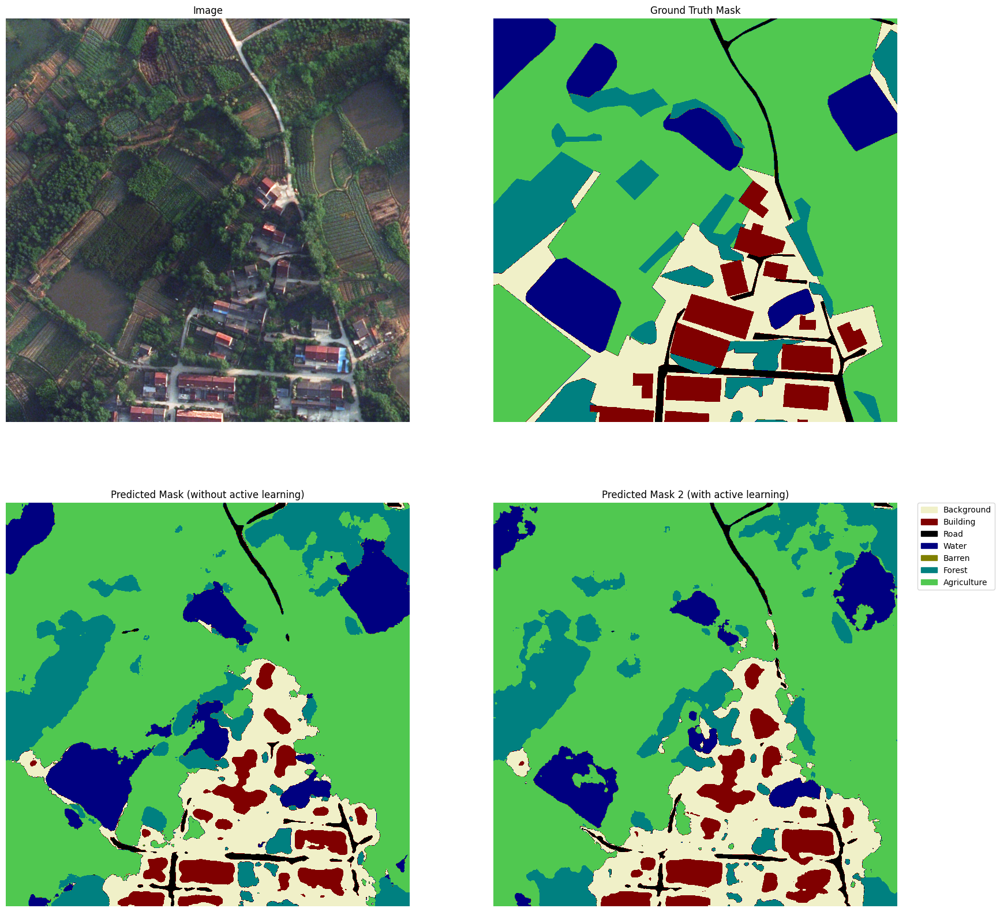

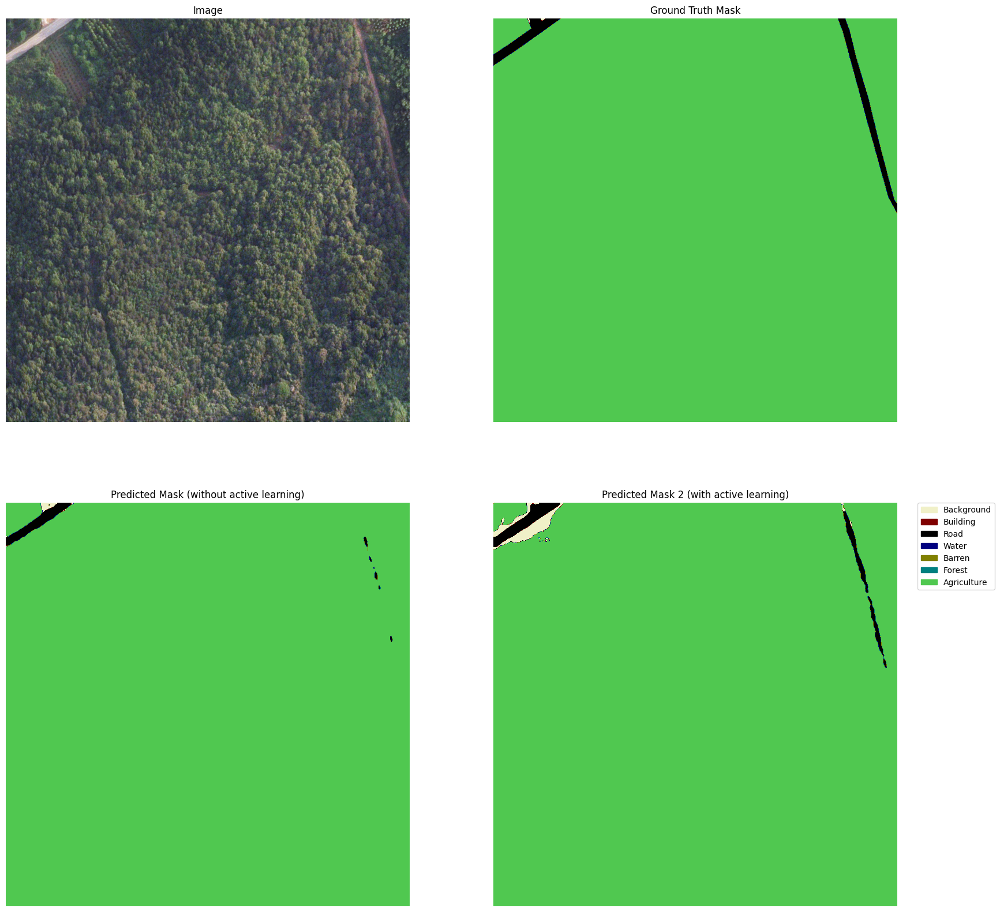

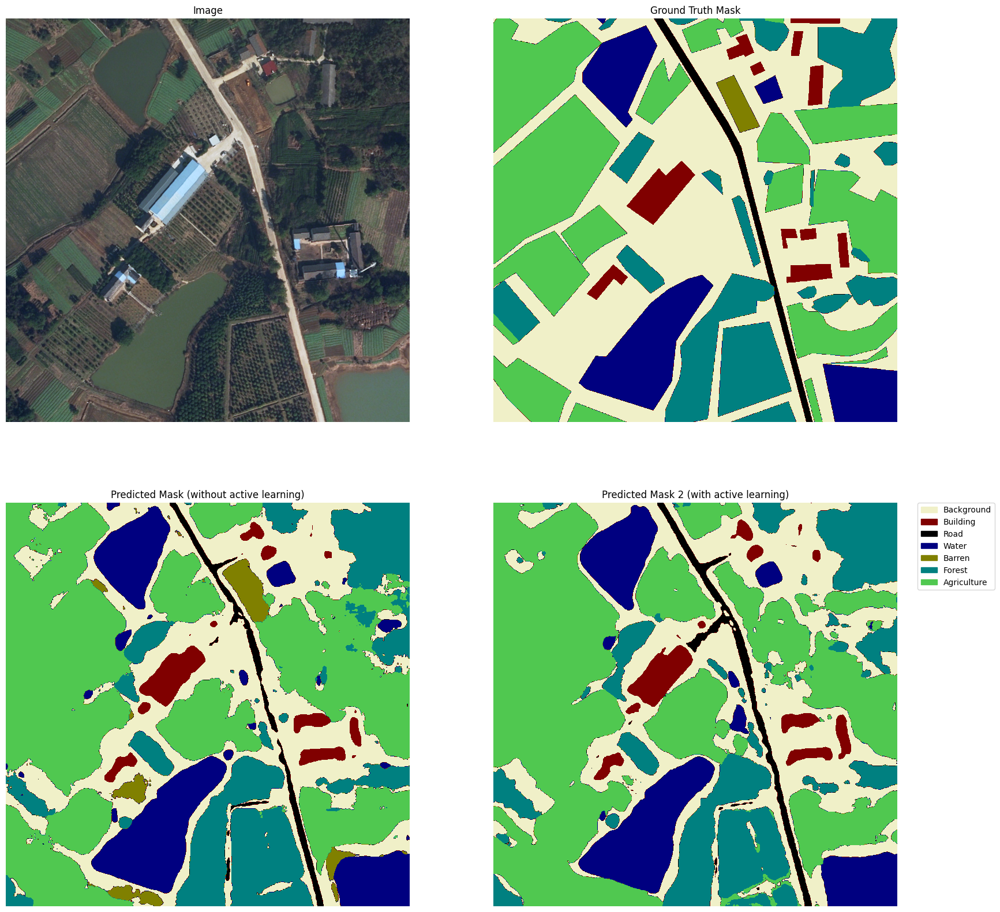

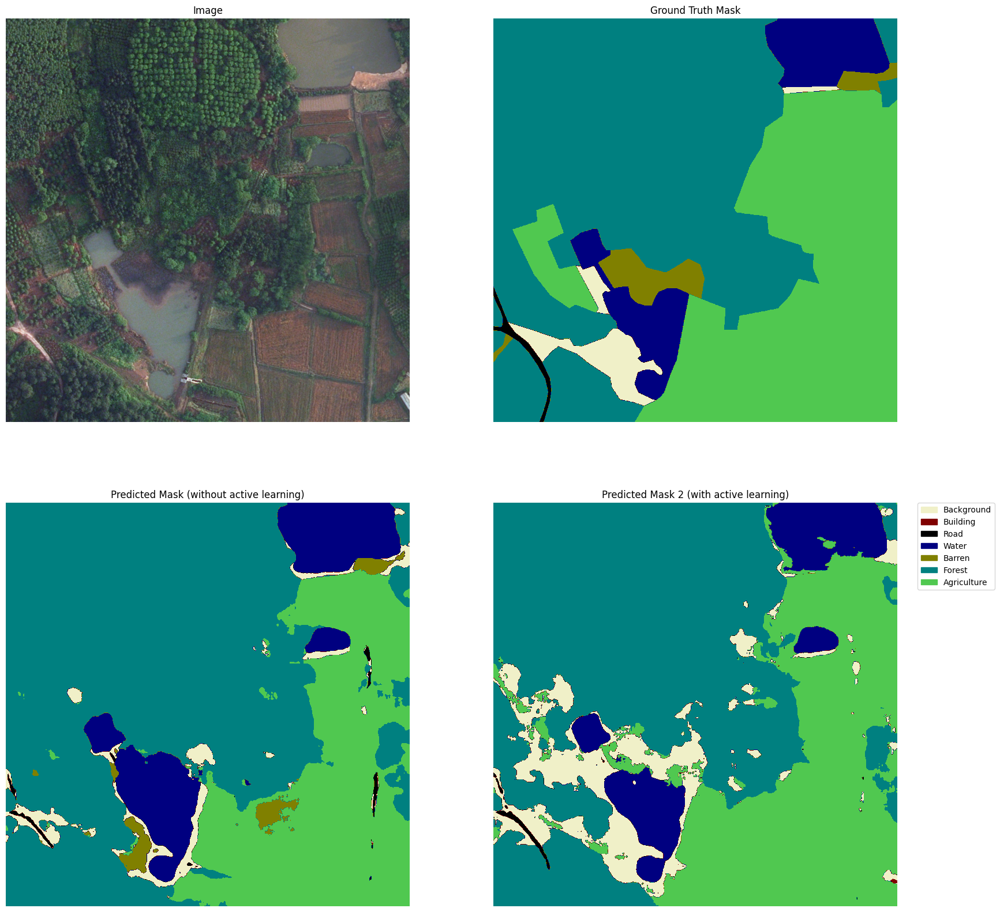

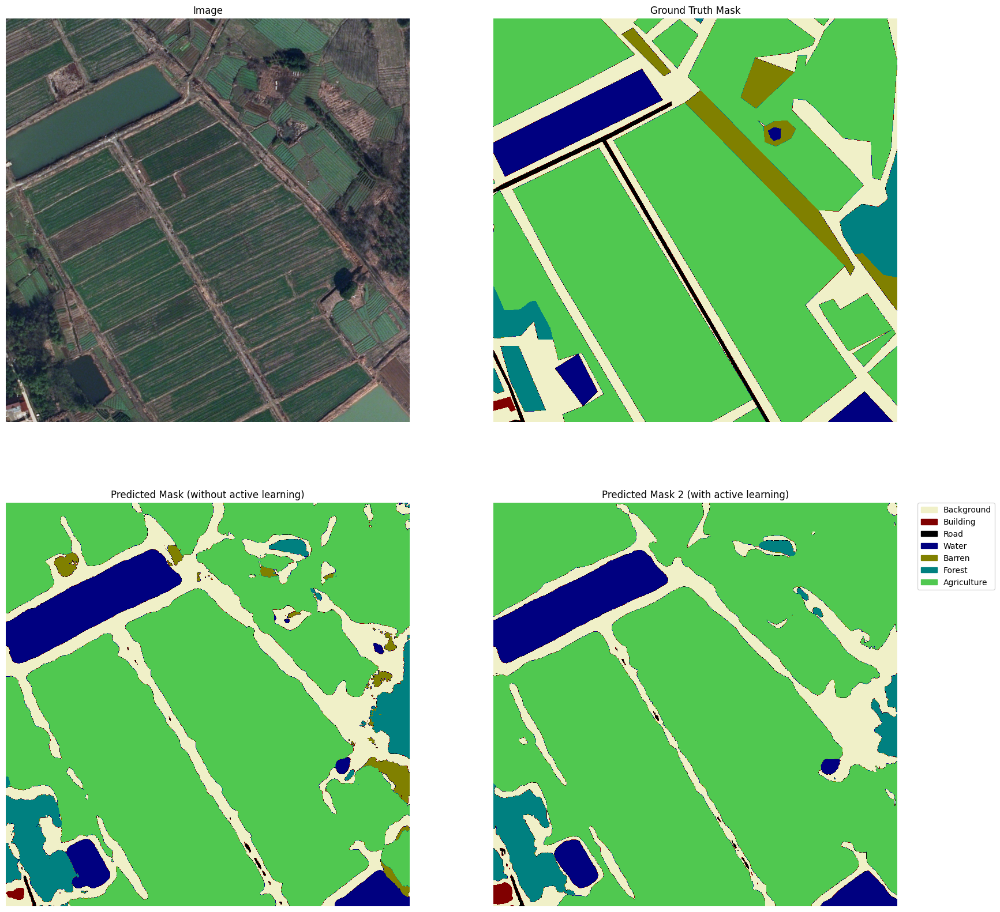

...

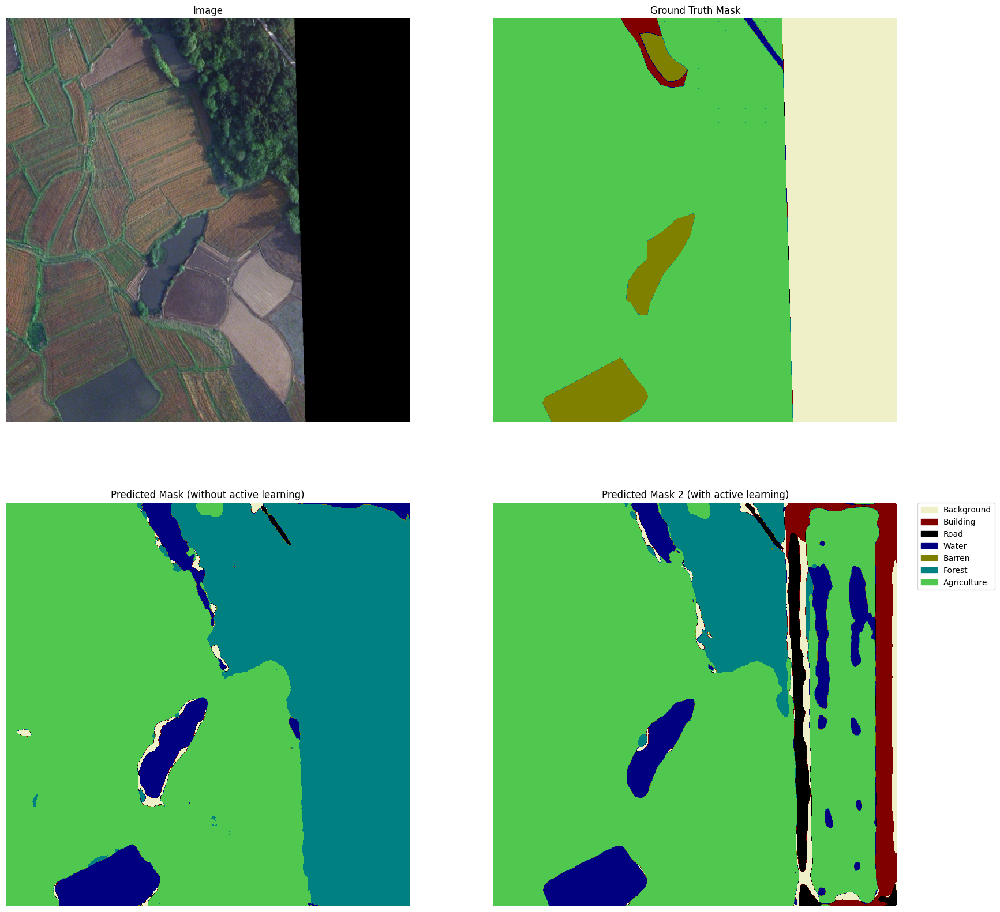

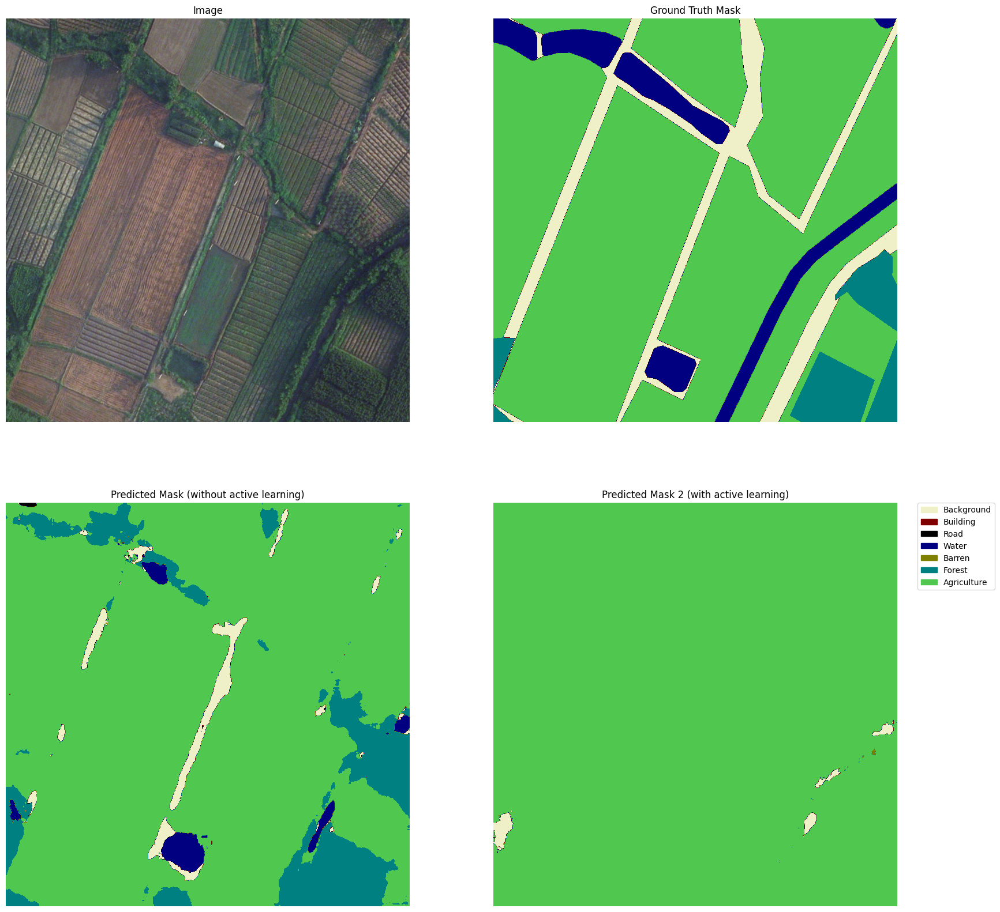

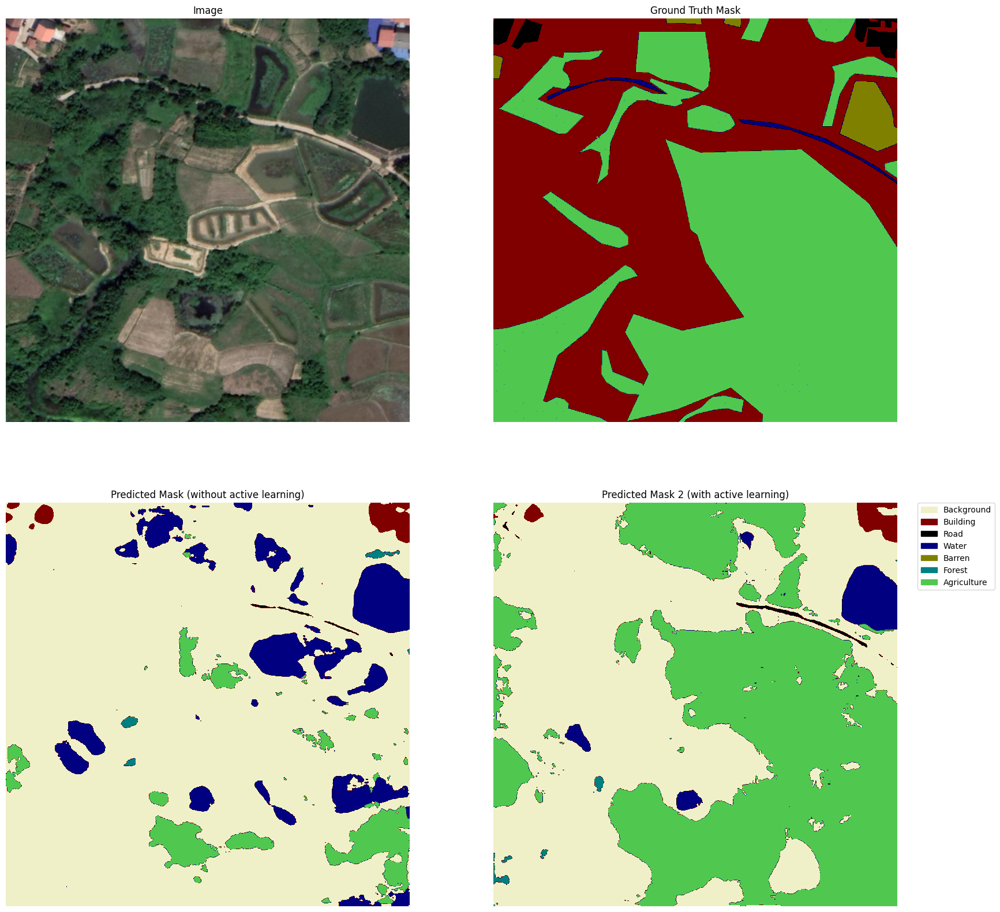

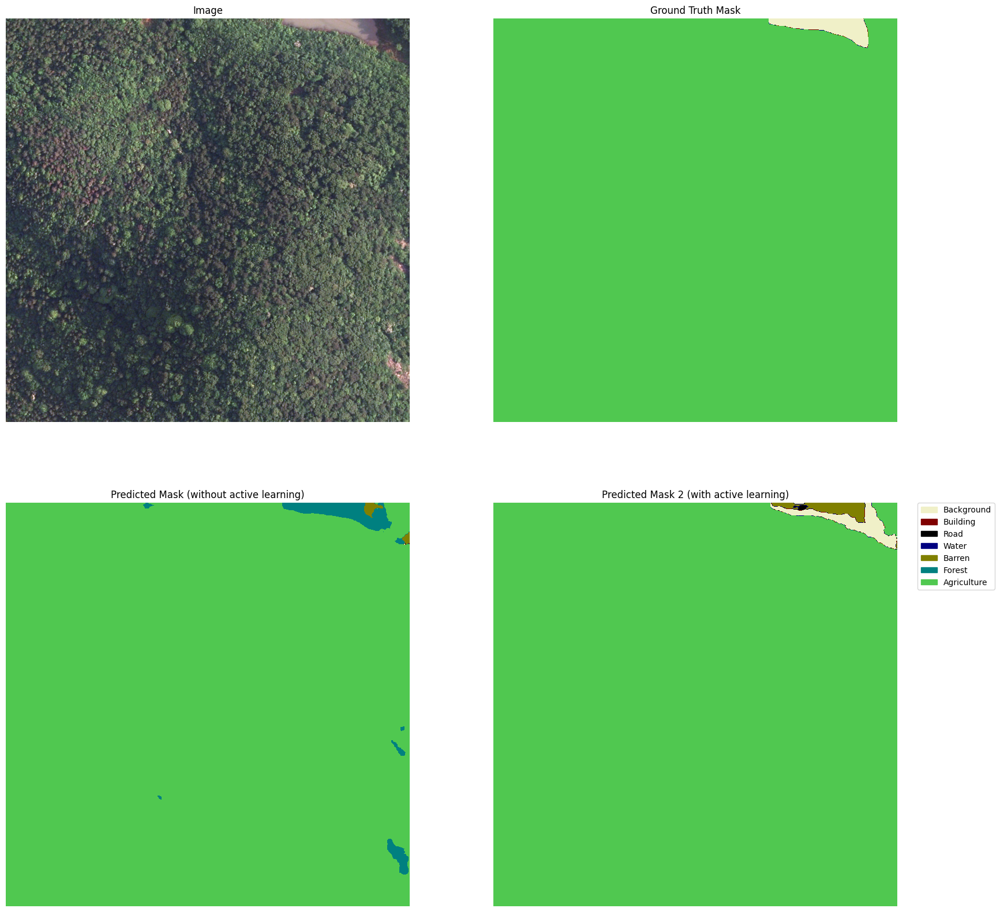

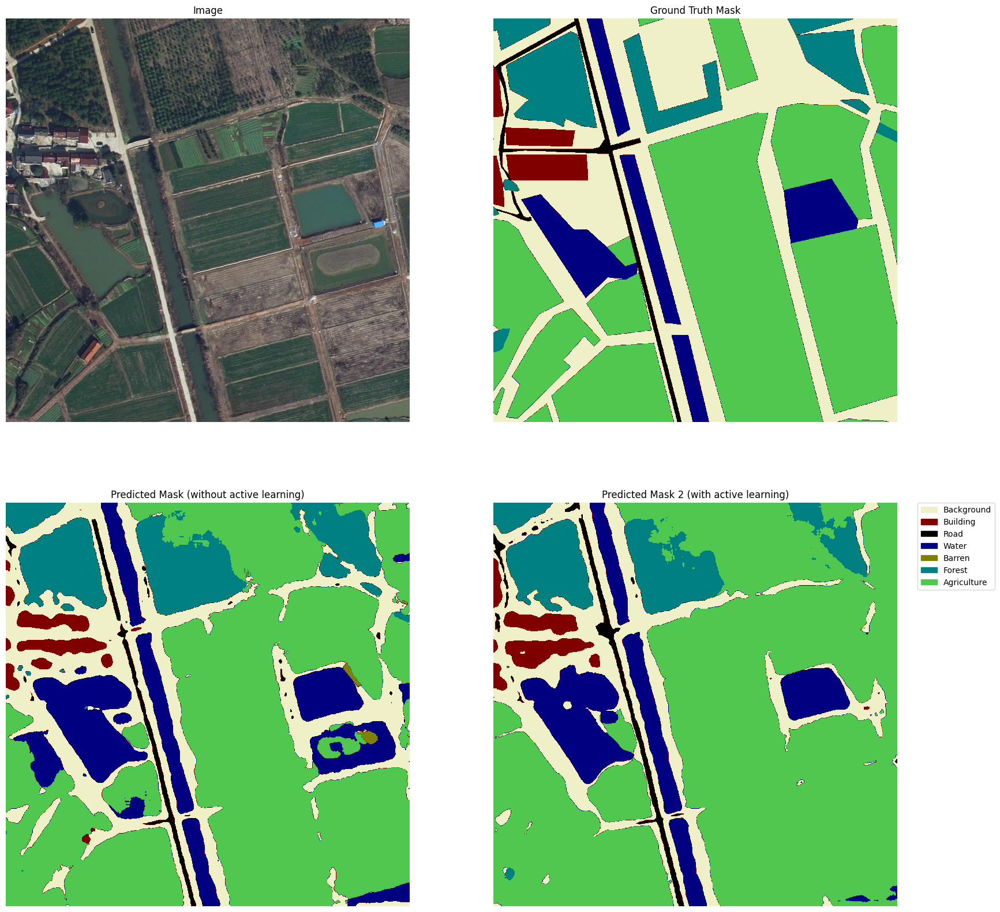

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import os
from matplotlib.colors import ListedColormap

# Define the class names and their corresponding colors
CLASSES = [
    "Background",
    "Building",
    "Road",
    "Water",
    "Barren",
    "Forest",
    "Agriculture"
]

PALETTE = [
    [240, 240, 200],  # Background: Gray
    [128, 0, 0],      # Building: Dark Red
    [0, 0, 0],      # Road: Dark Green
    [0, 0, 128],      # Water: Dark Blue
    [128, 128, 0],    # Barren: Olive
    [0, 128, 128],    # Forest: Teal
    [80, 200, 80]     # Agriculture: Purple
]

# Convert the PALETTE to a colormap
cmap = ListedColormap(np.array(PALETTE) / 255.0)

# Define paths
img_dir = 'mmsegmentation/data/loveDA/img_dir/train'
ann_dir = 'mmsegmentation/data/loveDA/ann_dir/train'

# Get a list of images and their corresponding ground truth masks
image_paths = sorted(os.listdir(img_dir))
mask_paths = sorted(os.listdir(ann_dir))

# Display predictions for a few images
for i in range(360,371):  # Adjust the range to display specific images
    img_path = os.path.join(img_dir, image_paths[i])
    mask_path = os.path.join(ann_dir, mask_paths[i])

    # Load the image and ground truth mask
    image, ground_truth = load_image_and_mask(img_path, mask_path)

    # Predict the mask
    result_1 = inference_model(model_nonactive, img_path)
    result_2 = inference_model(model_active, img_path)
    # Extract the predicted mask
    predicted_mask_1 = result_1.pred_sem_seg.data.cpu().numpy()[0]
    predicted_mask_2 = result_2.pred_sem_seg.data.cpu().numpy()[0]
    
    plt.figure(figsize=(20, 20))

    plt.subplot(2, 2, 1)
    plt.title("Image")
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(ground_truth, cmap=cmap)
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.title("Predicted Mask (without active learning)")
    plt.imshow(predicted_mask_1, cmap=cmap)
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.title("Predicted Mask 2 (with active learning)")
    plt.imshow(predicted_mask_2, cmap=cmap)
    plt.axis('off')



    # Create a list of legend patches
    legend_patches = [mpatches.Patch(color=np.array(color)/255.0, label=cls) for cls, color in zip(CLASSES, PALETTE)]

    # Add the legend to the plot
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    plt.show()

In [18]:
os.listdir(ann_dir)

[]